# Visualising atlas mapping

In [1]:
# Load packages
suppressPackageStartupMessages({
    library(Seurat)
    library(scran)
    library(scater)
    library(batchelor)
    library(SingleCellExperiment)
    library(scater)
    library(Matrix)
    library(reshape2)
    library(data.table)
    library(BiocParallel)
    library(dplyr)
    library(gridExtra)
})

    ncores = 4
    mcparam = MulticoreParam(workers = ncores)
    register(mcparam)
    BPPARAM = SerialParam()

options(repr.plot.width=15, repr.plot.height=8)

In [5]:
main = "/rds/project/rds-SDzz0CATGms/users/bt392/03_Stat3_RNA/"
out_dir = paste0(main, '07_atlas_mapping/')
plot_dir = paste0(main, '07_atlas_mapping/plots/')
dir.create(out_dir, showWarnings = FALSE)
dir.create(plot_dir, showWarnings = FALSE)

source(paste0(main, "mapping_functions_extended.R"))

In [6]:
load_data(normalise=TRUE)
sce_query = sce[Matrix::rowSums(counts(sce)) > 0,]
meta_query = meta

In [7]:
sce

class: SingleCellExperiment 
dim: 29453 45281 
metadata(0):
assays(2): counts logcounts
rownames(29453): ENSMUSG00000051951 ENSMUSG00000089699 ...
  ENSMUSG00000095742 tomato-td
rowData names(0):
colnames(45281): cell_1 cell_2 ... cell_45280 cell_45281
colData names(1): sizeFactor
reducedDimNames(0):
altExpNames(0):

In [8]:
head(meta)

,cell,Sample_name,barcode,batch,batch_name,tdTom,index,sample,stage,doub.density,doublet,stripped,umap_1,umap_2,louvain_cluster
,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<lgl>,<lgl>,<chr>,<chr>,<int>
1,cell_1,MLT_31+ Tom,AAACCCAAGATGTTCC,1,SLX-21143_SITTA2_HTJH3DSX2,positive,1,1,E8.5,1.6362461561249,FALSE,FALSE,-5.96996593475342,0.833129286766052,20
2,cell_2,MLT_31+ Tom,AAACCCATCAGACCTA,1,SLX-21143_SITTA2_HTJH3DSX2,positive,2,1,E8.5,33.8962703601108,FALSE,FALSE,2.12909245491028,-7.22718572616577,11
3,cell_3,MLT_31+ Tom,AAACGAACAATGTTGC,1,SLX-21143_SITTA2_HTJH3DSX2,positive,3,1,E8.5,27.9322352081812,FALSE,FALSE,11.9839191436768,-6.76919794082642,17
4,cell_4,MLT_31+ Tom,AAACGAACACACCAGC,1,SLX-21143_SITTA2_HTJH3DSX2,positive,4,1,E8.5,1.5723540523525,FALSE,FALSE,-4.15473318099976,0.86513215303421,20
5,cell_5,MLT_31+ Tom,AAACGAAGTGATAGTA,1,SLX-21143_SITTA2_HTJH3DSX2,positive,5,1,E8.5,1.9457119797229,FALSE,FALSE,-6.27074193954468,-0.678434550762177,20
6,cell_6,MLT_31+ Tom,AAACGAAGTTAAGACA,1,SLX-21143_SITTA2_HTJH3DSX2,positive,6,1,E8.5,28.042102,FALSE,FALSE,17.1983280181885,4.63033485412598,7


In [9]:
mappings = read.csv(paste0(out_dir,"mapped.csv"))

In [10]:
meta_complete = merge(meta_query, mappings, by='cell')

In [11]:
meta_complete$umap_1 = as.numeric(meta_complete$umap_1)
meta_complete$umap_2 = as.numeric(meta_complete$umap_2)

### Project on atlas UMAP

In [13]:
atlas_in = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/extended/'
umap =  read.csv(paste0(atlas_in, 'umap.csv'))
atlas_meta = readRDS(paste0(atlas_in, 'integrated_meta_celltype_clus.rds'))
atlas_meta = atlas_meta[, c('cell', 'sample', 'stage', 'celltype.descendant', 'celltype.clustering')]
colnames(atlas_meta) = c('cell', 'sample', 'stage', 'celltype_original', 'celltype')
atlas_meta = merge(atlas_meta, umap, by='cell')

In [14]:
colnames(umap) = c('closest.cell', 'umapX.mapped', 'umapY.mapped')
meta_complete = merge(meta_complete, umap, by='closest.cell')

In [15]:
meta_complete = meta_complete[order(meta_complete$index),]
write.csv(meta_complete, file =  paste0(out_dir,"meta_complete.csv"),row.names=FALSE)

In [14]:
# Plot projected UMAP

p1 = ggplot(atlas_meta, aes(umapX, umapY, col=celltype)) + 
    geom_point(alpha = 0.5, size = 0.15) + 
    scale_colour_manual(values = celltype_colours_final, name = "celltype") +
    labs(title = "Extended atlas UMAP",
    subtitle = "Celltypes") +
    umap_theme

legend_plot = ggplot(atlas_meta, aes(umapX, umapY, col=celltype)) +
    geom_point(size = 3) + 
    scale_colour_manual(values = celltype_colours_final, name = "celltype") + 
    theme_bw()
p1_legend = cowplot::get_legend(legend_plot)

p2 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=celltype.mapped)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.5, size = 0.7) + 
    scale_colour_manual(values = celltype_colours_final, name = "celltype") +
    labs(title = "Stat3 projected UMAP",
    subtitle = "Mapped celltypes") + 
    umap_theme


p3 = ggplot(atlas_meta, aes(umapX, umapY, col=celltype_original)) + 
    geom_point(alpha = 0.5, size = 0.15) + 
    scale_colour_manual(values = celltype_colours, name = "celltype") +
    labs(title = "",
    subtitle = "Original celltypes") + 
    umap_theme

legend_plot = ggplot(atlas_meta, aes(umapX, umapY, col=celltype)) +
    geom_point(size = 3) + 
    scale_colour_manual(values = celltype_colours, name = "celltype") + 
    theme_bw() + guides(colour = guide_legend(nrow = 5))
p3_legend = cowplot::get_legend(legend_plot)

p4 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=celltype_original.mapped)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.5, size =  0.7) + 
    scale_colour_manual(values = celltype_colours, name = "celltype") +
    labs(title = "",
    subtitle = "") +  
    umap_theme

p5 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=stage)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.5, size =  0.7) + 
    scale_colour_manual(values = stage_colours_final, name = "Stage") +
    labs(title = "Projected UMAP",
    subtitle = "Actual stages") + 
    umap_theme

legend_plot = ggplot(atlas_meta, aes(umapX, umapY, col=stage)) +
    geom_point(size = 3) + guides(colour = guide_legend(nrow = 1)) +
    scale_colour_manual(values = stage_colours_final, name = "stage") + 
    theme_bw() + theme(text = element_text(size = 15))
p5_legend = cowplot::get_legend(legend_plot)

p6 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=stage.mapped)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.5, size =  0.7) + 
    scale_colour_manual(values = stage_colours_final, name = "Stage") +
    labs(title = "",
    subtitle = "Mapped stages") + 
    umap_theme

### Mapping quantification three columns 
p7 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=celltype.score)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.5, size =  0.7) + 
  #  scale_colour_manual(values = stage_colours_final, name = "Stage") +
    labs(title = "Mapping scores",
    subtitle = "Celltype score") + 
    umap_theme

p8 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=celltype_original.score)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.5, size =  0.7) + 
  #  scale_colour_manual(values = stage_colours_final, name = "Stage") +
    labs(title = "",
    subtitle = "Orig. celltype score") + 
    umap_theme

p9 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=cellstage.score)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.5, size =  0.7) + 
  #  scale_colour_manual(values = stage_colours_final, name = "Stage") +
    labs(title = "",
    subtitle = "Stage score") + 
    umap_theme

p10 = ggplot(meta_complete, aes(umapX.mapped, umapY.mapped, col=tdTom)) + 
    geom_point(data = atlas_meta, aes(umapX, umapY), col='grey80') +
    geom_point(alpha = 0.4, size =  0.7) + 
    scale_colour_manual(values = c('positive' = 'red', 'negative' = 'black')) +
    ggtitle('Tomato') +
    umap_theme


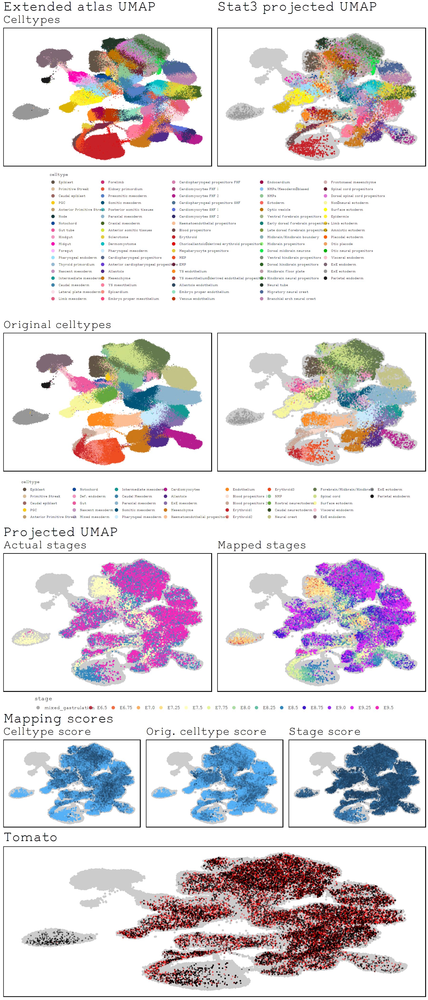

In [15]:
options(repr.plot.width=15, repr.plot.height=35)

p = grid.arrange(arrangeGrob(p1, p2, ncol = 2), p1_legend,
            arrangeGrob(p3, p4, ncol = 2), p3_legend,
            arrangeGrob(p5, p6, ncol = 2), p5_legend,
            arrangeGrob(p7, p8, p9, ncol = 3),
            p10, ncol = 1, heights = c(1, 0.8, 1, 0.3, 1, 0.1,0.7,1))
ggsave(paste(plot_dir, 'Atlas_projected.png'), p, device='png', width=15, height=35)

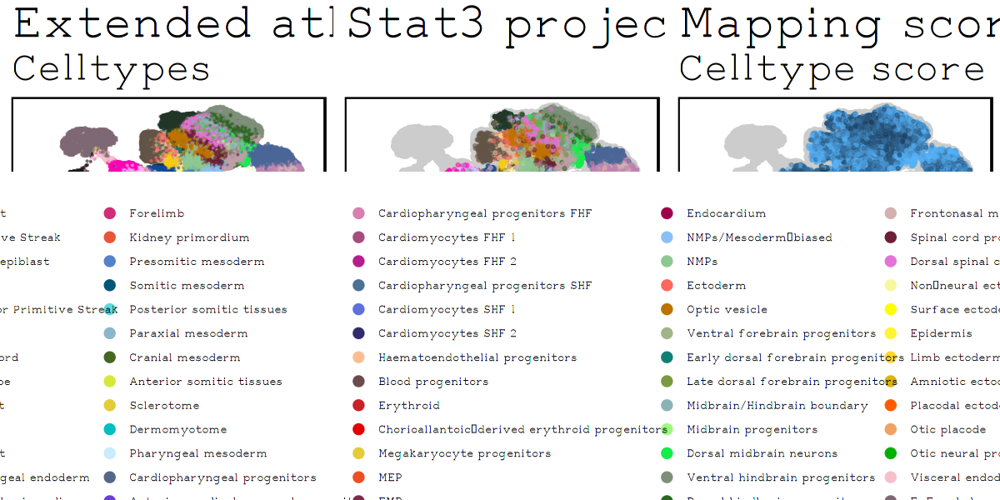

In [16]:
options(repr.plot.width=10, repr.plot.height=5)

p = grid.arrange(arrangeGrob(p1, p2, p7, ncol = 3), p1_legend,
                 ncol = 1, heights = c(1, 0.6))
ggsave(paste(plot_dir, 'Atlas_projected_celltypes.png'), p, device='png', width=20, height=10)

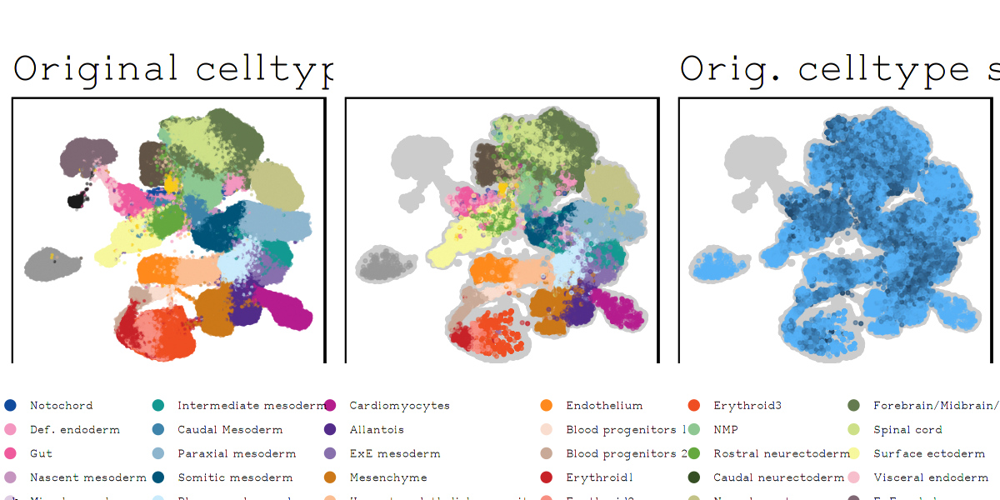

In [17]:
p = grid.arrange(arrangeGrob(p3, p4, p8, ncol = 3), p3_legend,
                 ncol = 1, heights = c(1, 0.3))
ggsave(paste(plot_dir, 'Atlas_projected_celltypes_original.png'), p, device='png', width=20, height=10)

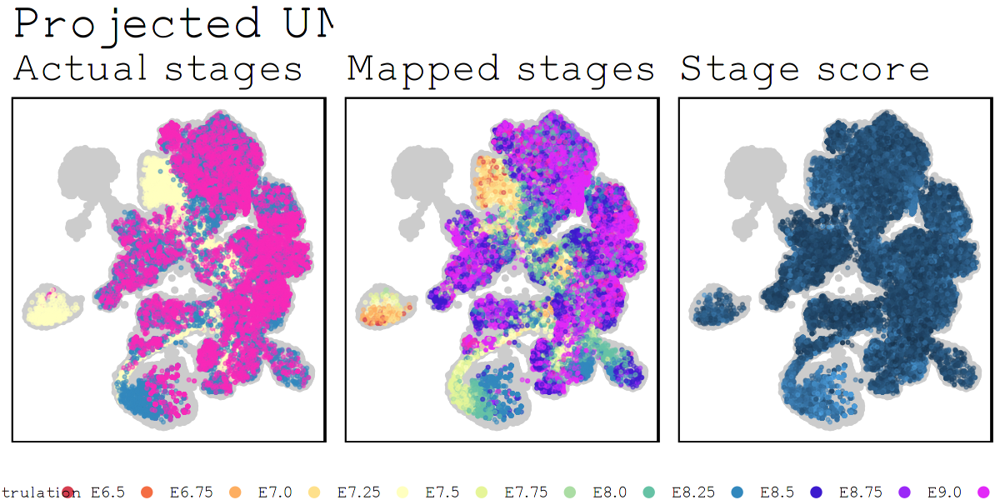

In [18]:
p = grid.arrange(arrangeGrob(p5, p6, p9, ncol = 3), p5_legend,
                 ncol = 1, heights = c(1, 0.1))
ggsave(paste(plot_dir, 'Atlas_projected_stages.png'), p, device='png', width=20, height=10)

In [19]:
p = p10
ggsave(paste(plot_dir, 'Atlas_projected_tomato.png'), p, device='png', width=15, height=10)

### Plotting on Stat3 only UMAP

In [20]:
# Plotting of Stat3 UMAP
p1 = ggplot(meta_complete, aes(umap_1, umap_2, col=tdTom)) +
    geom_point(alpha = 0.4, size =  0.7) + 
    scale_colour_manual(values = c('positive' = 'red', 'negative' = 'black')) +
    ggtitle('Tomato') +
    umap_theme

p2 = ggplot(meta_complete, aes(umap_1, umap_2, col=celltype.mapped)) +
    geom_point(alpha = 0.5, size = 0.7) + 
    scale_colour_manual(values = celltype_colours_final, name = "celltype") +
    labs(title = "Stat3 UMAP",
    subtitle = "Celltype") + 
    umap_theme

legend_plot = ggplot(atlas_meta, aes(umapX, umapY, col=celltype)) +
    geom_point(size = 3) + 
    scale_colour_manual(values = celltype_colours_final, name = "celltype") + 
    theme_bw()
p2_legend = cowplot::get_legend(legend_plot)

p3 = ggplot(meta_complete, aes(umap_1, umap_2, col=stage)) + 
    geom_point(alpha = 0.5, size =  0.7) + 
    scale_colour_manual(values = stage_colours_final, name = "Stage") +
    labs(title = "",
    subtitle = "Actual stages") + 
    umap_theme

legend_plot = ggplot(atlas_meta, aes(umapX, umapY, col=stage)) +
    geom_point(size = 3) + guides(colour = guide_legend(nrow = 1)) +
    scale_colour_manual(values = stage_colours_final, name = "stage") + 
    theme_bw() + theme(text = element_text(size = 15))
p3_legend = cowplot::get_legend(legend_plot)

p4 = ggplot(meta_complete, aes(umap_1, umap_2, col=stage.mapped)) + 
    geom_point(alpha = 0.5, size =  0.7) + 
    scale_colour_manual(values = stage_colours_final, name = "Stage") +
    labs(title = "",
    subtitle = "Mapped stages") + 
    umap_theme

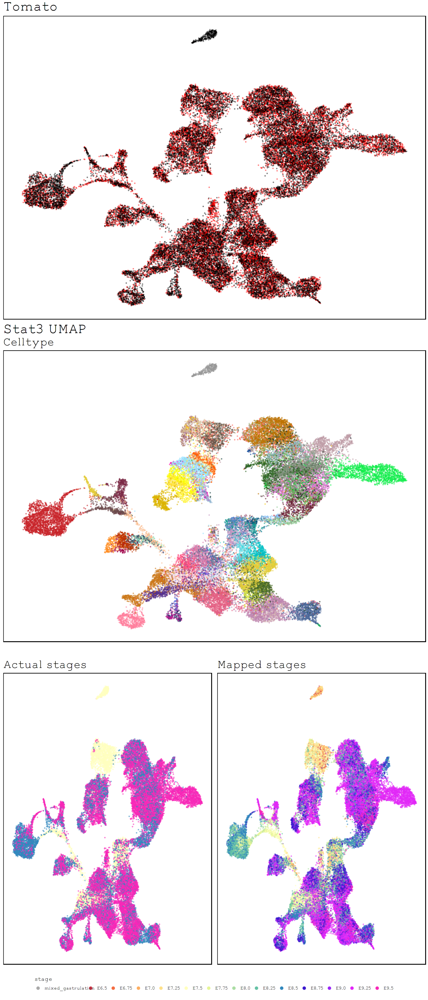

In [21]:
options(repr.plot.width=15, repr.plot.height=35)

p = grid.arrange(p1,
                p2, 
                arrangeGrob(p3, p4, ncol = 2), p3_legend,
                ncol = 1, heights = c(1, 1,1 ,0.1))
ggsave(paste(plot_dir, 'Stat3_umaps.png'), p, device='png', width=10, height=15)

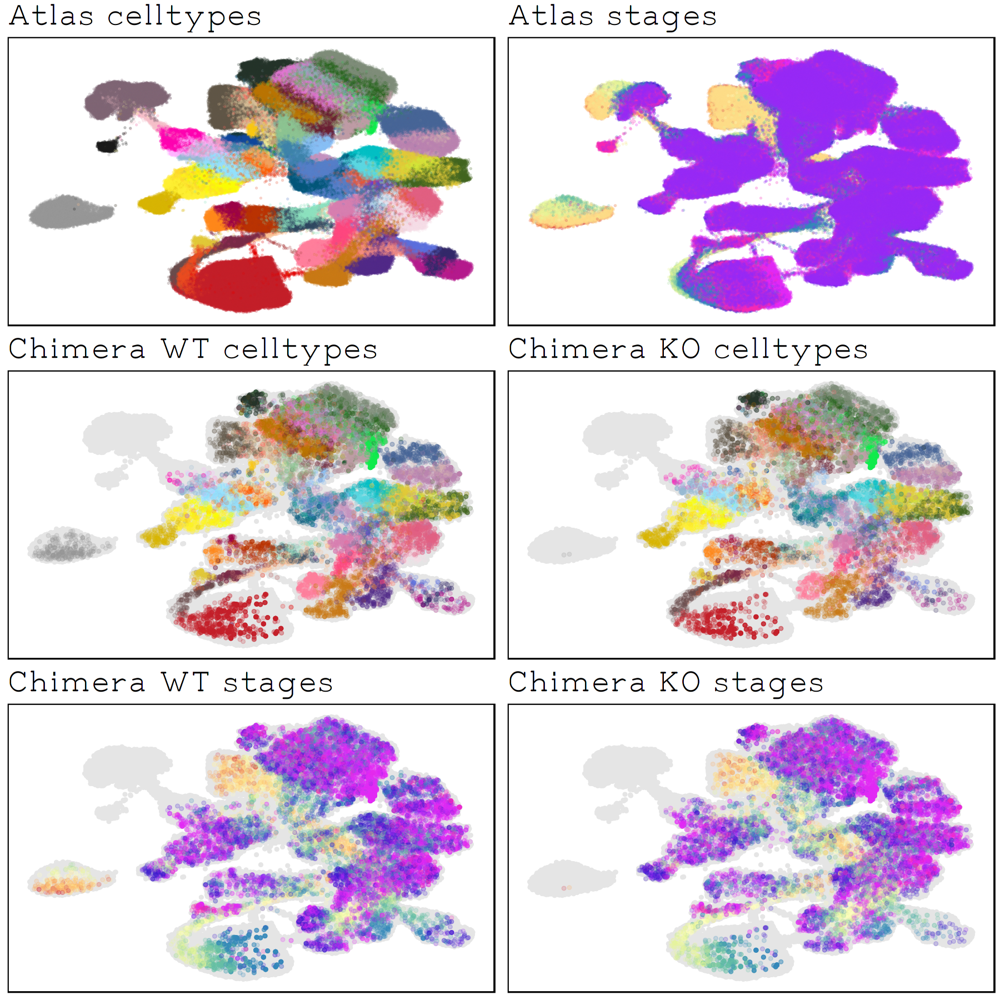

In [18]:
p1 = ggplot(atlas_meta, aes(umapX, umapY, col=celltype)) + 
    geom_point(alpha=0.2, size = 0.5) + 
    ggtitle('Atlas celltypes') + 
    scale_colour_manual(values = celltype_colours_final, name = "celltype") +
    umap_theme

p2 = ggplot(atlas_meta, aes(umapX, umapY, col=stage)) + 
    geom_point(alpha=0.2, size = 0.5) + 
    ggtitle('Atlas stages') + 
    scale_colour_manual(values = stage_colours_final, name = "Stage") +
    umap_theme

p3 = ggplot(meta_complete[meta_complete$tdTom=='negative',], aes(umapX.mapped, umapY.mapped, col=meta_complete[meta_complete$tdTom=='negative',]$celltype.mapped)) + 
    geom_point(data=atlas_meta, aes(umapX, umapY), col='grey90') + 
    geom_point(alpha=0.2) + 
    ggtitle('Chimera WT celltypes') + 
    scale_colour_manual(values = celltype_colours_final, name = "celltype") +
    umap_theme

p4 = ggplot(meta_complete[meta_complete$tdTom=='positive',], aes(umapX.mapped, umapY.mapped, col=meta_complete[meta_complete$tdTom=='positive',]$celltype.mapped)) + 
    geom_point(data=atlas_meta, aes(umapX, umapY), col='grey90') + 
    geom_point(alpha=0.2) + 
    ggtitle('Chimera KO celltypes') + 
    scale_colour_manual(values = celltype_colours_final, name = "celltype") +
    umap_theme

p5 = ggplot(meta_complete[meta_complete$tdTom=='negative',], aes(umapX.mapped, umapY.mapped, col=meta_complete[meta_complete$tdTom=='negative',]$stage.mapped)) + 
    geom_point(data=atlas_meta, aes(umapX, umapY), col='grey90') + 
    geom_point(alpha=0.2) + 
    ggtitle('Chimera WT stages') + 
    scale_colour_manual(values = stage_colours_final, name = "Stage") +
    umap_theme

p6 = ggplot(meta_complete[meta_complete$tdTom=='positive',], aes(umapX.mapped, umapY.mapped, col=meta_complete[meta_complete$tdTom=='positive',]$stage.mapped)) + 
    geom_point(data=atlas_meta, aes(umapX, umapY), col='grey90') + 
    geom_point(alpha=0.2) + 
    ggtitle('Chimera KO stages') + 
    scale_colour_manual(values = stage_colours_final, name = "Stage") +
    umap_theme

options(repr.plot.width=15, repr.plot.height=15)
grid.arrange(p1, p2, p3, p4, p5, p6, ncol=2)

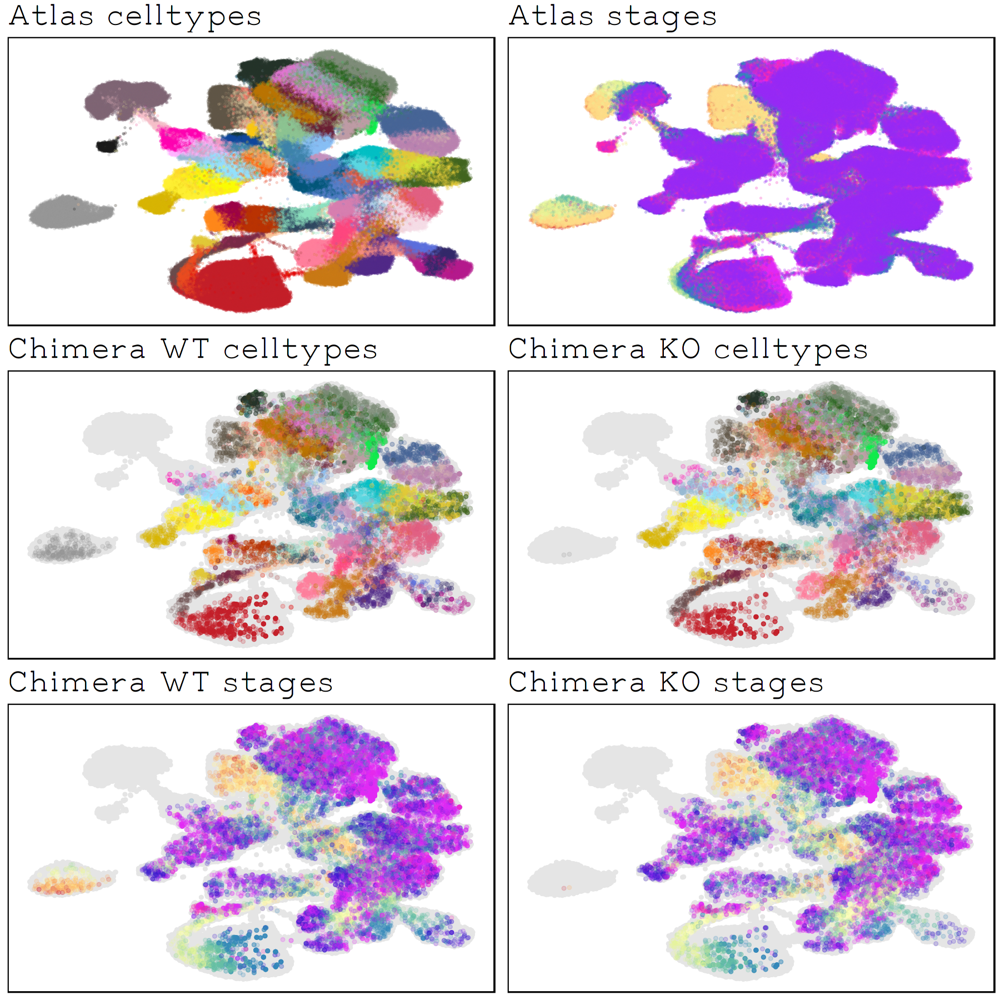

In [19]:
ggsave(paste0(plot_dir, 'Atlas_projection_KO_WT.png'), 
       plot = grid.arrange(p1, p2, p3, p4, p5, p6, ncol=2), 
       device = 'png',
       width = 12,
       height = 15,
       dpi = 300)